<a href="https://colab.research.google.com/github/MattValSE/AutoML2024_Team5/blob/main/Projekt2_Fin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Currently the best performing graph is Inductive with a noise threshold of 0.1

In [28]:
!pip install pm4py
!pip install graphviz
!pip install autosklearn
!pip install pandas
!pip install matplotlib
#!pip install auto-sklearn
!pip install hyperopt
!pip install scikit-optimize
!pip install pyDOE

ERROR: Could not find a version that satisfies the requirement autosklearn (from versions: none)
ERROR: No matching distribution found for autosklearn
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyDOE: filename=pyDOE-0.3.8-py3-none-any.whl size=18170 sha256=77d988574819b25dae45eb645cd8f00e77b04338da4605f4c66876903c951c35
  Stored in directory: /root/.cache/pip/wheels/ce/b6/d7/c6b64746dba6433c593e471e0ac3acf4f36040456d1d160d17
Successfully built pyDOE


In [29]:
import numpy as np
from sklearn import datasets
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from skopt import gp_minimize
from skopt.space import Real
from skopt.utils import use_named_args
import matplotlib.pyplot as plt


In [10]:
import pm4py
import json  # To store start and end activities as JSON
#from autosklearn.experimental.askl2 import AutoSklearn2Classifier

def import_xes(file_path):
    # Import the XES file
    event_log = pm4py.read_xes(file_path)

    # Get start and end activities
    start_activities = pm4py.get_start_activities(event_log)
    end_activities = pm4py.get_end_activities(event_log)

    # Print the results
    print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

    # Store the results
    pm4py.write_xes(event_log, "event_log.xes")  # Save the event log to a new XES file
    with open("start_activities.json", "w") as start_file:
        json.dump(start_activities, start_file, indent=4)
    with open("end_activities.json", "w") as end_file:
        json.dump(end_activities, end_file, indent=4)

    # Return the data for further processing
    return event_log, start_activities, end_activities

if __name__ == "__main__":
    # File path to the XES file
    file_path = "PrepaidTravelCost.xes"

    # Import the XES file and store the data
    event_log, start_activities, end_activities = import_xes(file_path)


/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:82: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


parsing log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

Start activities: {'Permit SUBMITTED by EMPLOYEE': 1859, 'Request For Payment SUBMITTED by EMPLOYEE': 233, 'Request For Payment SAVED by EMPLOYEE': 7}
End activities: {'Permit REJECTED by MISSING': 10, 'Payment Handled': 1970, 'Request For Payment REJECTED by MISSING': 7, 'Request For Payment REJECTED by EMPLOYEE': 72, 'Request For Payment SAVED by EMPLOYEE': 20, 'Permit FINAL_APPROVED by DIRECTOR': 6, 'Permit FINAL_APPROVED by SUPERVISOR': 12, 'Request For Payment REJECTED by ADMINISTRATION': 1, 'Request Payment': 1}


exporting log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

## Alpha_Miner

In [82]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_alpha(event_log)

# Visualize the Petri net
#gviz = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)
fitness_col = pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)["average_trace_fitness"]
generalization = pm4py.conformance.generalization_tbr(event_log,net, initial_marking, final_marking)
simplicity = pm4py.analysis.simplicity_petri_net(net, initial_marking, final_marking)

print(f"Fitness: {fitness_col}")
print(f"Generalization: {generalization}")
print(f"Simplicity: {simplicity}")


replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

Fitness: 0.45522736917670575
Generalization: 0.8773091720949231
Simplicity: 0.18670886075949367


## Heuristics

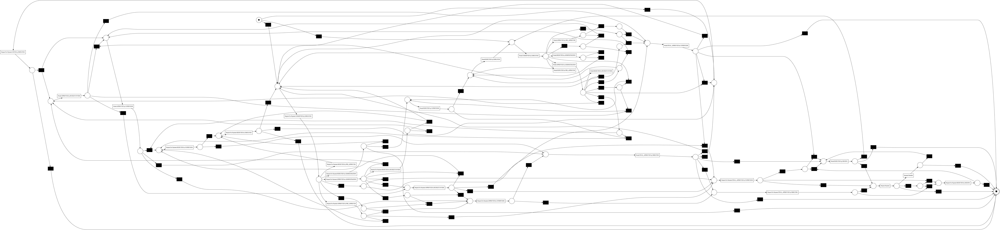

In [13]:
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(event_log)

# Visualize the Petri net
#gviz_Heur = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

In [96]:
import pandas as pd
# Define the thresholds you want to test
from hyperopt import hp, fmin, tpe, Trials

trials = Trials()

search_space = {'dependency_threshold': hp.loguniform('dependency_threshold', -6, 0),
    'and_threshold': hp.loguniform('and_threshold', -6, 4) }

# List to store results
results = []

def objective_function(params):


    # Run the Inductive Miner with the given parameters
    net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(
        event_log, dependency_threshold = params['dependency_threshold'], and_threshold = params['and_threshold']
    )

    # Evaluate the discovered process model (e.g., using fitness metric)
    fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
    generalization = pm4py.conformance.generalization_tbr(event_log,net, initial_marking, final_marking)
    simplicity = pm4py.analysis.simplicity_petri_net(net, initial_marking, final_marking)
    average_fitness = fitness['average_trace_fitness']
    perc_fit_traces = fitness['perc_fit_traces']

    results.append({
        "dependency_threshold": params['dependency_threshold'],
        "and_threshold": params['and_threshold'],
        "average_trace_fitness": average_fitness,
        "generalization":generalization,
        "simplicity":simplicity
        #"net": net,  # Optional: Store the Petri net for further use
        #"initial_marking": initial_marking,
        #"final_marking": final_marking
    })


    # Return the negative fitness as hyperopt minimizes by default
    return -average_fitness


best = fmin(
    fn=objective_function,  # Your objective function
    space=search_space,     # Your search space
    algo=tpe.suggest,       # Optimization algorithm
    max_evals=100,          # Number of evaluations
    trials=trials           # To log details of the optimization
)

results_df = pd.DataFrame(results)

# Print the best hyperparameters found
print("Best hyperparameters:", best)

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  1%|          | 1/100 [00:02<03:53,  2.36s/trial, best loss: -0.9767481278057148]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  2%|▏         | 2/100 [00:05<04:34,  2.80s/trial, best loss: -0.9767481278057148]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  3%|▎         | 3/100 [00:08<04:41,  2.91s/trial, best loss: -0.9767481278057148]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  4%|▍         | 4/100 [00:10<03:57,  2.47s/trial, best loss: -0.9829985775322179]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  5%|▌         | 5/100 [00:13<04:05,  2.58s/trial, best loss: -0.9829985775322179]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  6%|▌         | 6/100 [00:14<03:36,  2.31s/trial, best loss: -0.9891894971484634]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  7%|▋         | 7/100 [00:17<03:34,  2.30s/trial, best loss: -0.9891894971484634]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  8%|▊         | 8/100 [00:20<03:55,  2.56s/trial, best loss: -0.9891894971484634]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  9%|▉         | 9/100 [00:23<04:02,  2.66s/trial, best loss: -0.9891894971484634]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 10%|█         | 10/100 [00:24<03:35,  2.39s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 11%|█         | 11/100 [00:26<03:22,  2.27s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 12%|█▏        | 12/100 [00:29<03:14,  2.21s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 13%|█▎        | 13/100 [00:31<03:07,  2.16s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 14%|█▍        | 14/100 [00:33<03:16,  2.28s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 15%|█▌        | 15/100 [00:36<03:30,  2.47s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 16%|█▌        | 16/100 [00:39<03:34,  2.56s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 17%|█▋        | 17/100 [00:41<03:15,  2.36s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 18%|█▊        | 18/100 [00:43<03:06,  2.27s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 19%|█▉        | 19/100 [00:45<03:02,  2.25s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 20%|██        | 20/100 [00:48<03:15,  2.45s/trial, best loss: -0.9916666597163694]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 21%|██        | 21/100 [00:51<03:23,  2.58s/trial, best loss: -0.9918261877510722]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 22%|██▏       | 22/100 [00:52<02:52,  2.22s/trial, best loss: -0.9918261877510722]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 23%|██▎       | 23/100 [00:54<02:41,  2.10s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 24%|██▍       | 24/100 [00:56<02:32,  2.00s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 25%|██▌       | 25/100 [00:57<02:25,  1.93s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 26%|██▌       | 26/100 [00:59<02:22,  1.92s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 27%|██▋       | 27/100 [01:02<02:26,  2.01s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 28%|██▊       | 28/100 [01:05<03:03,  2.54s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 29%|██▉       | 29/100 [01:07<02:46,  2.35s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 30%|███       | 30/100 [01:09<02:33,  2.19s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 31%|███       | 31/100 [01:11<02:24,  2.09s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 32%|███▏      | 32/100 [01:13<02:21,  2.09s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 33%|███▎      | 33/100 [01:15<02:15,  2.02s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 34%|███▍      | 34/100 [01:18<02:28,  2.25s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 35%|███▌      | 35/100 [01:20<02:25,  2.23s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 36%|███▌      | 36/100 [01:22<02:15,  2.11s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 37%|███▋      | 37/100 [01:24<02:14,  2.13s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 38%|███▊      | 38/100 [01:26<02:06,  2.05s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 39%|███▉      | 39/100 [01:28<01:59,  1.96s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 40%|████      | 40/100 [01:31<02:23,  2.39s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 41%|████      | 41/100 [01:34<02:28,  2.52s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 42%|████▏     | 42/100 [01:36<02:14,  2.32s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 43%|████▎     | 43/100 [01:38<02:09,  2.27s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 44%|████▍     | 44/100 [01:40<01:59,  2.14s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 45%|████▌     | 45/100 [01:42<01:54,  2.09s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 46%|████▌     | 46/100 [01:44<01:55,  2.14s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 47%|████▋     | 47/100 [01:47<02:03,  2.33s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 48%|████▊     | 48/100 [01:50<02:11,  2.52s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 49%|████▉     | 49/100 [01:52<02:03,  2.42s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 50%|█████     | 50/100 [01:54<01:53,  2.26s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 51%|█████     | 51/100 [01:56<01:48,  2.21s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 52%|█████▏    | 52/100 [01:58<01:50,  2.31s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 53%|█████▎    | 53/100 [02:01<01:48,  2.31s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 54%|█████▍    | 54/100 [02:04<01:58,  2.58s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 55%|█████▌    | 55/100 [02:06<01:51,  2.49s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 56%|█████▌    | 56/100 [02:08<01:46,  2.42s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 57%|█████▋    | 57/100 [02:10<01:37,  2.27s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 58%|█████▊    | 58/100 [02:12<01:33,  2.22s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 59%|█████▉    | 59/100 [02:15<01:33,  2.28s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 60%|██████    | 60/100 [02:18<01:37,  2.45s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 61%|██████    | 61/100 [02:19<01:22,  2.11s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 62%|██████▏   | 62/100 [02:20<01:13,  1.92s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 63%|██████▎   | 63/100 [02:23<01:17,  2.10s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 64%|██████▍   | 64/100 [02:25<01:13,  2.05s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 65%|██████▌   | 65/100 [02:27<01:14,  2.13s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 66%|██████▌   | 66/100 [02:30<01:17,  2.28s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 67%|██████▋   | 67/100 [02:33<01:21,  2.47s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 68%|██████▊   | 68/100 [02:35<01:13,  2.29s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 69%|██████▉   | 69/100 [02:36<01:07,  2.19s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 70%|███████   | 70/100 [02:38<01:03,  2.11s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 71%|███████   | 71/100 [02:40<00:59,  2.04s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 72%|███████▏  | 72/100 [02:42<00:56,  2.03s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 73%|███████▎  | 73/100 [02:45<01:00,  2.24s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 74%|███████▍  | 74/100 [02:48<01:02,  2.40s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 75%|███████▌  | 75/100 [02:50<01:00,  2.44s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 76%|███████▌  | 76/100 [02:52<00:55,  2.29s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 77%|███████▋  | 77/100 [02:54<00:50,  2.19s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 78%|███████▊  | 78/100 [02:56<00:46,  2.10s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 79%|███████▉  | 79/100 [02:59<00:46,  2.21s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 80%|████████  | 80/100 [03:01<00:48,  2.41s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 81%|████████  | 81/100 [03:04<00:47,  2.48s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 82%|████████▏ | 82/100 [03:06<00:41,  2.31s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 83%|████████▎ | 83/100 [03:08<00:38,  2.27s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 84%|████████▍ | 84/100 [03:10<00:35,  2.19s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 85%|████████▌ | 85/100 [03:12<00:31,  2.11s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 86%|████████▌ | 86/100 [03:14<00:30,  2.15s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 87%|████████▋ | 87/100 [03:17<00:31,  2.42s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 88%|████████▊ | 88/100 [03:20<00:30,  2.53s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 89%|████████▉ | 89/100 [03:22<00:25,  2.35s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 90%|█████████ | 90/100 [03:24<00:22,  2.23s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 91%|█████████ | 91/100 [03:26<00:19,  2.20s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 92%|█████████▏| 92/100 [03:29<00:18,  2.28s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 93%|█████████▎| 93/100 [03:32<00:18,  2.65s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 94%|█████████▍| 94/100 [03:34<00:14,  2.43s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 95%|█████████▌| 95/100 [03:36<00:11,  2.29s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 96%|█████████▌| 96/100 [03:38<00:08,  2.19s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 97%|█████████▋| 97/100 [03:40<00:06,  2.13s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 98%|█████████▊| 98/100 [03:42<00:04,  2.09s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 99%|█████████▉| 99/100 [03:45<00:02,  2.30s/trial, best loss: -0.9925551384382807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

100%|██████████| 100/100 [03:48<00:00,  2.29s/trial, best loss: -0.9925551384382807]
Best hyperparameters: {'and_threshold': 49.33817798370037, 'dependency_threshold': 0.0053574915064888975}


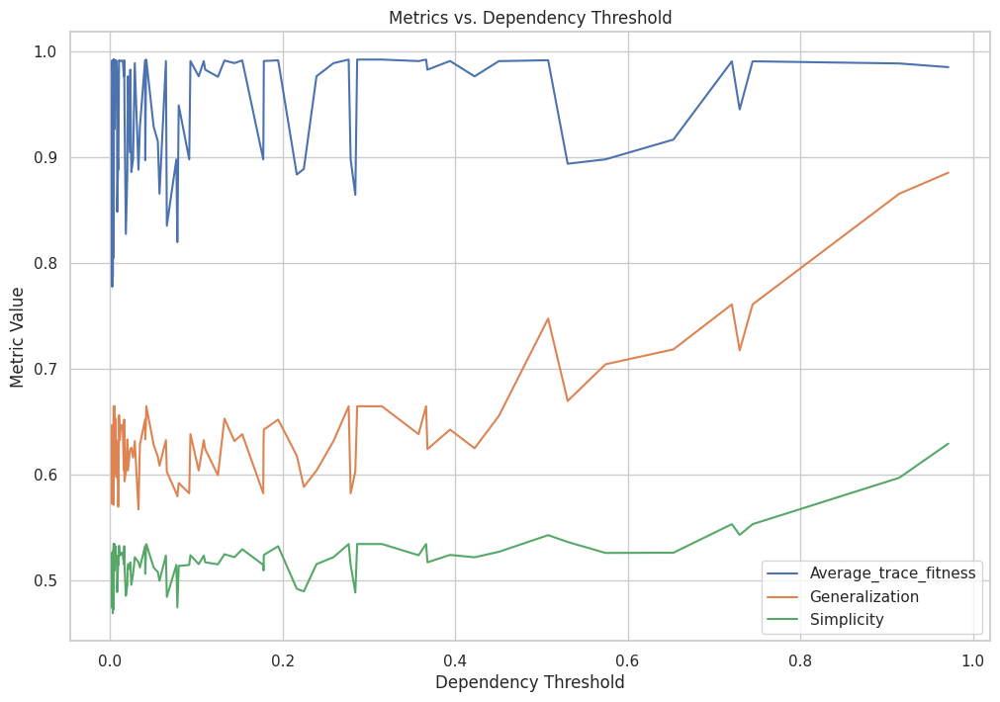

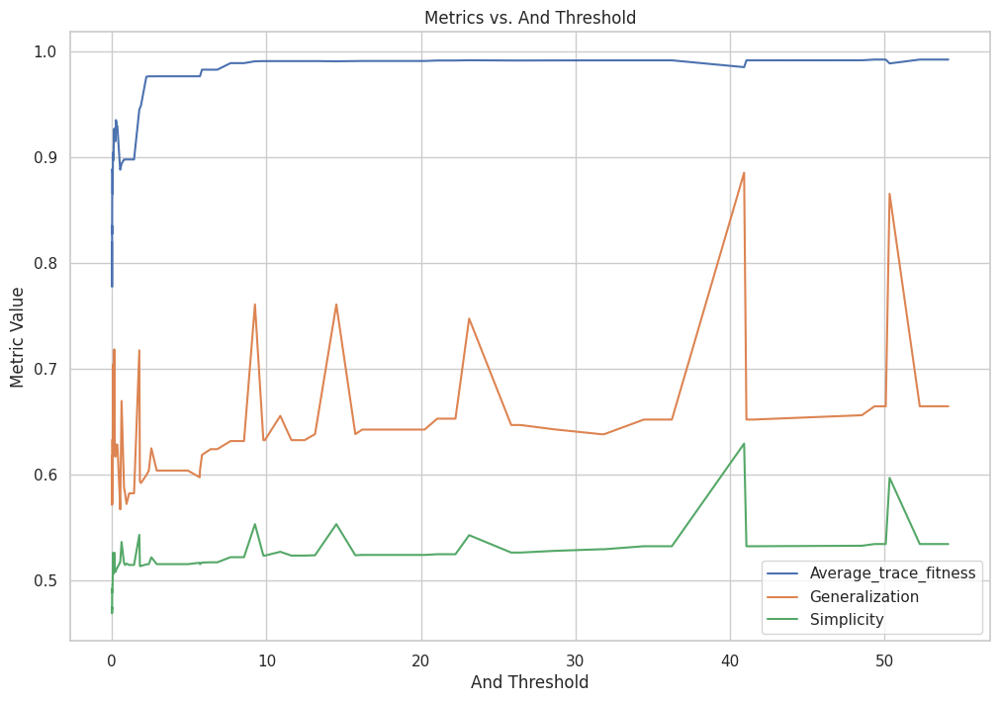

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from hyperopt import hp, fmin, tpe, Trials
from hyperopt.pyll.base import scope
from skopt.space import Real
import pm4py


# Visualization Section
sns.set(style="whitegrid")

# Line plots for metrics vs hyperparameters
plt.figure(figsize=(12, 8))
for metric in ["average_trace_fitness", "generalization", "simplicity"]:
    sns.lineplot(
        data=results_df.sort_values(by="dependency_threshold"),
        x="dependency_threshold",
        y=metric,
        label=metric.capitalize()
    )
plt.title("Metrics vs. Dependency Threshold")
plt.xlabel("Dependency Threshold")
plt.ylabel("Metric Value")
plt.legend()
plt.show()

plt.figure(figsize=(12, 8))
for metric in ["average_trace_fitness", "generalization", "simplicity"]:
    sns.lineplot(
        data=results_df.sort_values(by="and_threshold"),
        x="and_threshold",
        y=metric,
        label=metric.capitalize()
    )
plt.title("Metrics vs. And Threshold")
plt.xlabel("And Threshold")
plt.ylabel("Metric Value")
plt.legend()
plt.show()




## Inductive

The perc_fit_traces is not as as important compared to average_trace_fitness, because overall this model should be the best due to its average_trace_fitness.
It just isn't correct entirely, but has parts that are in error. Overall fitness is still very good.

In [102]:
from hyperopt import hp, fmin, tpe, Trials
trials = Trials()


# Define the SVM model's hyperparameter space
search_space = {'noise_threshold': hp.loguniform('noise_threshold', -6, 4) }

def objective_function(params):
    #print("a",params)
    # Run the Inductive Miner with the given parameters
    net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(
        event_log, noise_threshold = params['noise_threshold']
    )

    # Evaluate the discovered process model (e.g., using fitness metric)
    fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
    generalization = pm4py.conformance.generalization_tbr(event_log,net, initial_marking, final_marking)
    simplicity = pm4py.analysis.simplicity_petri_net(net, initial_marking, final_marking)
    average_fitness = fitness['average_trace_fitness']
    perc_fit_traces = fitness['perc_fit_traces']

    results.append({
        "noise_threshold": params['noise_threshold'],
        "average_trace_fitness": average_fitness,
        "generalization":generalization,
        "simplicity":simplicity
        #"net": net,  # Optional: Store the Petri net for further use
        #"initial_marking": initial_marking,
        #"final_marking": final_marking
    })




    # Return the negative fitness as hyperopt minimizes by default
    return -average_fitness


best = fmin(
    fn=objective_function,  # Your objective function
    space=search_space,     # Your search space
    algo=tpe.suggest,       # Optimization algorithm
    max_evals=100,          # Number of evaluations
    trials=trials           # To log details of the optimization
)

results_df_ind = pd.DataFrame(results)

# Print the best hyperparameters found
print("Best hyperparameters:", best)

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<02:05,  1.26s/trial, best loss: -0.7349336948848717]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  2%|▏         | 2/100 [00:05<05:12,  3.19s/trial, best loss: -0.9892998537018902]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  3%|▎         | 3/100 [00:09<05:30,  3.41s/trial, best loss: -0.9892998537018902]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  4%|▍         | 4/100 [00:18<09:05,  5.68s/trial, best loss: -0.9892998537018902]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  5%|▌         | 5/100 [00:19<06:19,  4.00s/trial, best loss: -0.9892998537018902]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  6%|▌         | 6/100 [00:21<05:02,  3.22s/trial, best loss: -0.9892998537018902]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  7%|▋         | 7/100 [00:24<04:49,  3.12s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  8%|▊         | 8/100 [00:27<04:38,  3.03s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

  9%|▉         | 9/100 [00:30<04:38,  3.06s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 10%|█         | 10/100 [00:31<03:55,  2.62s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 11%|█         | 11/100 [00:33<03:14,  2.19s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 12%|█▏        | 12/100 [00:36<03:50,  2.62s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 13%|█▎        | 13/100 [00:38<03:31,  2.43s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 14%|█▍        | 14/100 [00:41<03:43,  2.60s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 15%|█▌        | 15/100 [00:47<04:55,  3.48s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 16%|█▌        | 16/100 [00:53<05:59,  4.28s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 17%|█▋        | 17/100 [00:54<04:45,  3.44s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 18%|█▊        | 18/100 [01:00<05:44,  4.20s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 19%|█▉        | 19/100 [01:03<05:04,  3.76s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 20%|██        | 20/100 [01:04<03:53,  2.92s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 21%|██        | 21/100 [01:08<04:11,  3.19s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 22%|██▏       | 22/100 [01:12<04:30,  3.47s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 23%|██▎       | 23/100 [01:15<04:10,  3.25s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 24%|██▍       | 24/100 [01:16<03:16,  2.59s/trial, best loss: -0.9985556192078558]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 25%|██▌       | 25/100 [01:18<03:18,  2.65s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 26%|██▌       | 26/100 [01:23<03:49,  3.10s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 27%|██▋       | 27/100 [01:28<04:24,  3.63s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 28%|██▊       | 28/100 [01:29<03:43,  3.10s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 29%|██▉       | 29/100 [01:32<03:30,  2.97s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 30%|███       | 30/100 [01:37<04:00,  3.44s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 31%|███       | 31/100 [01:40<03:55,  3.41s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 32%|███▏      | 32/100 [01:42<03:20,  2.94s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 33%|███▎      | 33/100 [01:43<02:38,  2.37s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 34%|███▍      | 34/100 [01:47<03:12,  2.91s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 35%|███▌      | 35/100 [01:50<03:17,  3.04s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 36%|███▌      | 36/100 [01:52<02:46,  2.60s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 37%|███▋      | 37/100 [01:54<02:30,  2.38s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 38%|███▊      | 38/100 [01:59<03:21,  3.24s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 39%|███▉      | 39/100 [02:02<03:09,  3.10s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 40%|████      | 40/100 [02:06<03:24,  3.41s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 41%|████      | 41/100 [02:08<03:01,  3.08s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 42%|████▏     | 42/100 [02:10<02:35,  2.68s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 43%|████▎     | 43/100 [02:12<02:15,  2.38s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 44%|████▍     | 44/100 [02:13<01:50,  1.98s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 45%|████▌     | 45/100 [02:14<01:33,  1.69s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 46%|████▌     | 46/100 [02:17<02:01,  2.24s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 47%|████▋     | 47/100 [02:21<02:19,  2.63s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 48%|████▊     | 48/100 [02:23<02:06,  2.43s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 49%|████▉     | 49/100 [02:25<01:56,  2.28s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 50%|█████     | 50/100 [02:31<02:52,  3.45s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 51%|█████     | 51/100 [02:32<02:20,  2.88s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 52%|█████▏    | 52/100 [02:36<02:33,  3.19s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 53%|█████▎    | 53/100 [02:39<02:24,  3.07s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 54%|█████▍    | 54/100 [02:43<02:36,  3.41s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 55%|█████▌    | 55/100 [02:47<02:34,  3.43s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 56%|█████▌    | 56/100 [02:53<03:09,  4.31s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 57%|█████▋    | 57/100 [02:54<02:22,  3.32s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 58%|█████▊    | 58/100 [02:56<02:00,  2.86s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 59%|█████▉    | 59/100 [02:58<01:48,  2.64s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 60%|██████    | 60/100 [03:01<01:50,  2.77s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 61%|██████    | 61/100 [03:04<01:51,  2.86s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 62%|██████▏   | 62/100 [03:06<01:41,  2.66s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 63%|██████▎   | 63/100 [03:10<01:43,  2.80s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 64%|██████▍   | 64/100 [03:11<01:22,  2.28s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 65%|██████▌   | 65/100 [03:17<02:07,  3.63s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 66%|██████▌   | 66/100 [03:21<01:58,  3.49s/trial, best loss: -0.9985932942538382]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 67%|██████▋   | 67/100 [03:24<01:52,  3.40s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 68%|██████▊   | 68/100 [03:27<01:45,  3.29s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 69%|██████▉   | 69/100 [03:32<01:59,  3.87s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 70%|███████   | 70/100 [03:35<01:48,  3.63s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 71%|███████   | 71/100 [03:37<01:31,  3.14s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 72%|███████▏  | 72/100 [03:40<01:27,  3.12s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 73%|███████▎  | 73/100 [03:45<01:40,  3.73s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 74%|███████▍  | 74/100 [03:52<01:58,  4.56s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 75%|███████▌  | 75/100 [03:54<01:37,  3.91s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 76%|███████▌  | 76/100 [03:57<01:26,  3.60s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 77%|███████▋  | 77/100 [04:04<01:47,  4.69s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 78%|███████▊  | 78/100 [04:07<01:32,  4.20s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 79%|███████▉  | 79/100 [04:09<01:11,  3.40s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 80%|████████  | 80/100 [04:12<01:06,  3.30s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 81%|████████  | 81/100 [04:16<01:07,  3.57s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 82%|████████▏ | 82/100 [04:18<00:55,  3.10s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 83%|████████▎ | 83/100 [04:21<00:52,  3.07s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 84%|████████▍ | 84/100 [04:24<00:48,  3.01s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 85%|████████▌ | 85/100 [04:25<00:36,  2.46s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 86%|████████▌ | 86/100 [04:28<00:37,  2.68s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 87%|████████▋ | 87/100 [04:31<00:36,  2.80s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 88%|████████▊ | 88/100 [04:35<00:34,  2.89s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 89%|████████▉ | 89/100 [04:36<00:28,  2.59s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 90%|█████████ | 90/100 [04:38<00:21,  2.15s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 91%|█████████ | 91/100 [04:53<00:56,  6.25s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 92%|█████████▏| 92/100 [04:58<00:45,  5.70s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 93%|█████████▎| 93/100 [05:00<00:32,  4.69s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 94%|█████████▍| 94/100 [05:04<00:26,  4.38s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 95%|█████████▌| 95/100 [05:11<00:26,  5.35s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 96%|█████████▌| 96/100 [05:15<00:18,  4.72s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 97%|█████████▋| 97/100 [05:17<00:11,  3.89s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 98%|█████████▊| 98/100 [05:22<00:08,  4.40s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

 99%|█████████▉| 99/100 [05:25<00:03,  3.98s/trial, best loss: -0.9990295258387092]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

100%|██████████| 100/100 [05:29<00:00,  3.29s/trial, best loss: -0.9990295258387092]
Best hyperparameters: {'noise_threshold': 0.01052530131592027}


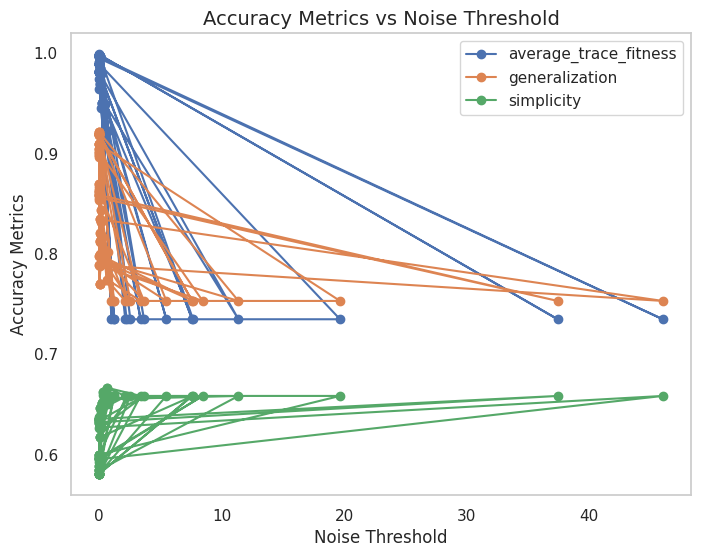

In [103]:
# Plotting
plt.figure(figsize=(8, 6))
for metric in ["average_trace_fitness", "generalization", "simplicity"]:
    plt.plot(results_df_ind["noise_threshold"], results_df_ind[metric], label=metric, marker='o')

plt.xlabel("Noise Threshold", fontsize=12)
plt.ylabel("Accuracy Metrics", fontsize=12)
plt.title("Accuracy Metrics vs Noise Threshold", fontsize=14)
plt.legend()
plt.grid()
plt.show()


Highest average trace

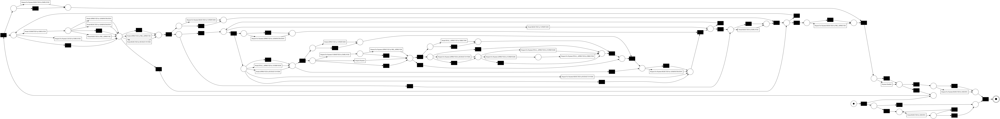

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 4.525964745116722,
 'average_trace_fitness': 0.9825456376805412,
 'log_fitness': 0.9821036079345102,
 'percentage_of_fitting_traces': 4.525964745116722}

In [55]:
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=0.002530580845789849)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

Highest perc_fit_traces *1000* runs

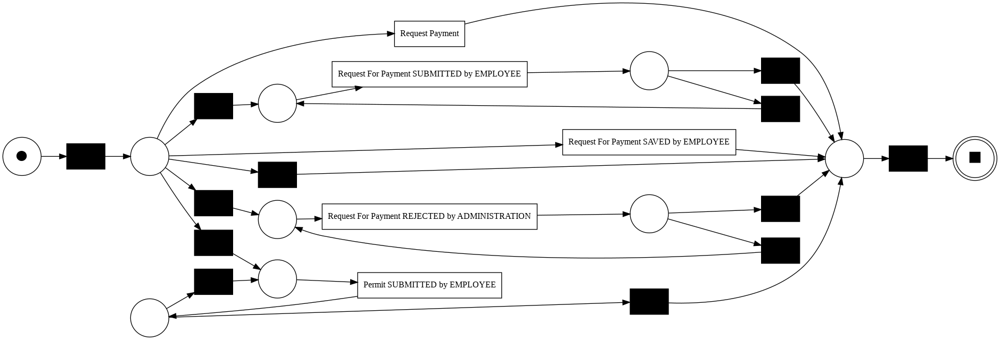

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 0.5717008099094807,
 'average_trace_fitness': 0.7349336948848717,
 'log_fitness': 0.7338662124090939,
 'percentage_of_fitting_traces': 0.5717008099094807}

In [56]:
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=2.136125632684549)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

Highest perc_fit_traces *100* runs

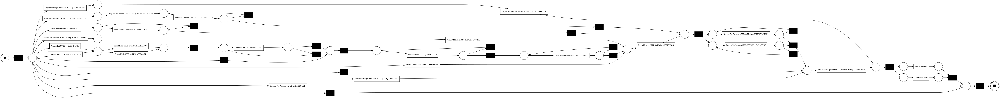

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 28.346831824678418,
 'average_trace_fitness': 0.9226563388751986,
 'log_fitness': 0.930393823620666,
 'percentage_of_fitting_traces': 28.346831824678418}

In [58]:
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=0.9784297343499846)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

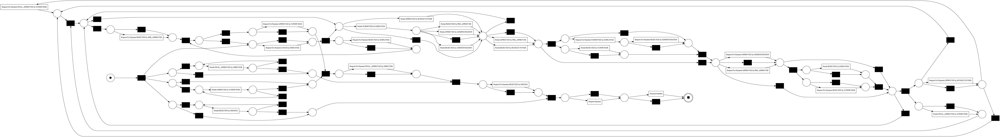

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 33.15864697474988,
 'average_trace_fitness': 0.9895298498902211,
 'log_fitness': 0.9881569616263494,
 'percentage_of_fitting_traces': 33.15864697474988}

In [59]:
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=0.008138310087455596)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

##  Redundant Visualizations

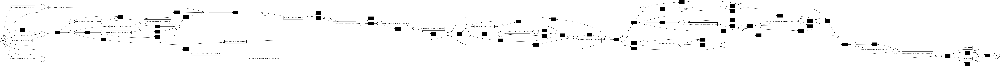

In [21]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=0.1)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [22]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 68.69938065745593,
 'average_trace_fitness': 0.9692526805707641,
 'log_fitness': 0.979976540883585,
 'percentage_of_fitting_traces': 68.69938065745593}

In [23]:
pm4py.conformance.conformance_diagnostics_alignments(event_log,net, initial_marking, final_marking)

aligning log, completed variants ::   0%|          | 0/202 [00:00<?, ?it/s]

[{'alignment': [('>>', None),
   ('>>', None),
   ('Permit SUBMITTED by EMPLOYEE', 'Permit SUBMITTED by EMPLOYEE'),
   ('>>', None),
   ('Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by ADMINISTRATION'),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('Request For Payment SUBMITTED by EMPLOYEE',
    'Request For Payment SUBMITTED by EMPLOYEE'),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('Request For Payment APPROVED by ADMINISTRATION',
    'Request For Payment APPROVED by ADMINISTRATION'),
   ('Permit FINAL_APPROVED by SUPERVISOR', '>>'),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('>>', None),
   ('Request For Payment FINAL_APPROVED by SUPERVISOR',
    'Request For Payment FINAL_APPROVED by SUPERVISOR'),
   ('>>', None),
   ('Request Payment', 'Request Payment'),
   ('Payment Handled', 'Payment Handled'),
   ('>>', None)],
  'cost': 10020,
  'visited_states': 125,

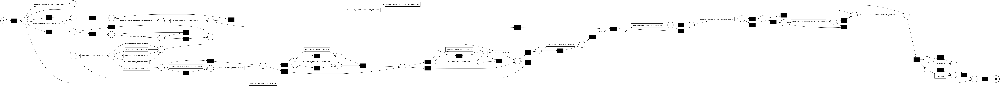

In [24]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log,noise_threshold=0.2)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [25]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 54.64506908051453,
 'average_trace_fitness': 0.9504794678708974,
 'log_fitness': 0.9657522252283467,
 'percentage_of_fitting_traces': 54.64506908051453}

In [57]:
"""
from hyperopt import hp, fmin, tpe, Trials
trials = Trials()


# Define the SVM model's hyperparameter space
search_space = hp.loguniform('noise_threshold', -6.91, 100.0)

def objective_function(params):


    print("a",params)
    # Run the Inductive Miner with the given parameters
    net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(
        event_log, noise_threshold = threshold
    )

    # Evaluate the discovered process model (e.g., using fitness metric)
    fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
    average_fitness = fitness['average_trace_fitness']
    perc_fit_traces = fitness['perc_fit_traces']


    # Return the negative fitness as hyperopt minimizes by default
    return -perc_fit_traces


best = fmin(
    fn=objective_function,  # Your objective function
    space=search_space,     # Your search space
    algo=tpe.suggest,       # Optimization algorithm
    max_evals=100,          # Number of evaluations
    trials=trials           # To log details of the optimization
)

# Print the best hyperparameters found
print("Best hyperparameters:", best)
"""

a
0.008138310087455596
  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.0227735264809982e+29
  1%|          | 1/100 [00:00<00:49,  2.00trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.649392619358372e+26
  2%|▏         | 2/100 [00:01<00:47,  2.05trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
12089473.717652382
  3%|▎         | 3/100 [00:01<00:53,  1.80trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.754235448315557e+19
  4%|▍         | 4/100 [00:02<00:53,  1.78trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.776636223883329e+24
  5%|▌         | 5/100 [00:02<00:52,  1.81trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
593217.6414642845
  6%|▌         | 6/100 [00:03<00:52,  1.80trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1755449.0942362088
  7%|▋         | 7/100 [00:04<00:59,  1.57trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
69847885975664.79
  8%|▊         | 8/100 [00:04<01:03,  1.45trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
7.546634753387241e+26
  9%|▉         | 9/100 [00:05<01:04,  1.40trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1688538258488386.5
 10%|█         | 10/100 [00:06<01:06,  1.35trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.3112062505448334e+24
 11%|█         | 11/100 [00:07<01:22,  1.07trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
53874.27278939865
 12%|█▏        | 12/100 [00:08<01:14,  1.18trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
3.3990281323419636e+24
 13%|█▎        | 13/100 [00:09<01:04,  1.35trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
921741616953257.6
 14%|█▍        | 14/100 [00:09<01:00,  1.42trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.1968103898788417e+24
 15%|█▌        | 15/100 [00:10<00:55,  1.53trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.2688560417377266
 16%|█▌        | 16/100 [00:10<00:51,  1.63trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.002591208525958377
 17%|█▋        | 17/100 [00:11<00:48,  1.70trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5795226.886922367
 18%|█▊        | 18/100 [00:11<00:49,  1.64trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.046353939726234e+38
 19%|█▉        | 19/100 [00:12<00:48,  1.67trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.03525523953958971
 20%|██        | 20/100 [00:12<00:46,  1.73trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
10929954131.54786
 21%|██        | 21/100 [00:13<00:46,  1.71trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.887587575510914e+40
 22%|██▏       | 22/100 [00:14<00:44,  1.75trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.005098535470897554
 23%|██▎       | 23/100 [00:15<00:53,  1.44trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
501.8226572659115
 24%|██▍       | 24/100 [00:15<00:48,  1.57trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.4552273948079316e+39
 25%|██▌       | 25/100 [00:16<00:45,  1.64trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.001298180481793407
 26%|██▌       | 26/100 [00:16<00:45,  1.61trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
21.590281653418486
 27%|██▋       | 27/100 [00:17<00:44,  1.65trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.8455934867490995e+34
 28%|██▊       | 28/100 [00:17<00:41,  1.74trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.8338103750561825e+19
 29%|██▉       | 29/100 [00:18<00:44,  1.61trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
19949106347.21646
 30%|███       | 30/100 [00:19<00:47,  1.46trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.2774950621432623e+34
 31%|███       | 31/100 [00:20<00:49,  1.40trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.7976386374069335e+20
 32%|███▏      | 32/100 [00:21<00:51,  1.33trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2944005213.549626
 33%|███▎      | 33/100 [00:21<00:51,  1.31trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
3.995577549354747e+31
 34%|███▍      | 34/100 [00:23<01:03,  1.03trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.1296746507944994e+37
 35%|███▌      | 35/100 [00:23<00:53,  1.22trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.4962773535616324e+43
 36%|███▌      | 36/100 [00:24<00:47,  1.34trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.37096358037880023
 37%|███▋      | 37/100 [00:24<00:44,  1.41trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
110325942109.69147
 38%|███▊      | 38/100 [00:25<00:41,  1.50trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
3767.4784089084005
 39%|███▉      | 39/100 [00:26<00:37,  1.63trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.7644387476994777e+42
 40%|████      | 40/100 [00:26<00:37,  1.59trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.991299867896608e+28
 41%|████      | 41/100 [00:27<00:35,  1.65trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.9576129923020255e+18
 42%|████▏     | 42/100 [00:27<00:34,  1.70trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
39452143.17290363
 43%|████▎     | 43/100 [00:28<00:33,  1.73trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
120.30754810078759
 44%|████▍     | 44/100 [00:28<00:33,  1.69trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
13396944857444.564
 45%|████▌     | 45/100 [00:29<00:32,  1.71trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.764701474959264e+27
 46%|████▌     | 46/100 [00:30<00:37,  1.43trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.4174047376374789e+31
 47%|████▋     | 47/100 [00:31<00:34,  1.56trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
48034.81987541427
 48%|████▊     | 48/100 [00:31<00:33,  1.56trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.0019098281280572804
 49%|████▉     | 49/100 [00:32<00:31,  1.63trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.049340213657195
 50%|█████     | 50/100 [00:32<00:29,  1.68trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.9056179065392644e+16
 51%|█████     | 51/100 [00:33<00:30,  1.60trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
9.475490750183172e+21
 52%|█████▏    | 52/100 [00:34<00:33,  1.45trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
5.3223097696163175e+35
 53%|█████▎    | 53/100 [00:35<00:34,  1.37trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.3796334686393029e+23
 54%|█████▍    | 54/100 [00:35<00:35,  1.29trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
9.291380796809448e+16
 55%|█████▌    | 55/100 [00:36<00:35,  1.25trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4596683274671.827
 56%|█████▌    | 56/100 [00:37<00:36,  1.20trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
473759496.0449912
 57%|█████▋    | 57/100 [00:38<00:38,  1.12trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
3.1735806015758396e+31
 58%|█████▊    | 58/100 [00:39<00:33,  1.26trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.9128059900629292e+25
 59%|█████▉    | 59/100 [00:39<00:29,  1.40trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.2939865445445573e+21
 60%|██████    | 60/100 [00:40<00:27,  1.46trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
501277671533878.56
 61%|██████    | 61/100 [00:40<00:24,  1.57trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1086454.8142437062
 62%|██████▏   | 62/100 [00:41<00:23,  1.59trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
340742379358.903
 63%|██████▎   | 63/100 [00:42<00:22,  1.63trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
8.905211494288266e+30
 64%|██████▍   | 64/100 [00:42<00:21,  1.64trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.152999344435488e+36
 65%|██████▌   | 65/100 [00:43<00:21,  1.65trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.1536403936453565e+42
 66%|██████▌   | 66/100 [00:43<00:19,  1.71trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
8.696891189898164e+40
 67%|██████▋   | 67/100 [00:44<00:19,  1.66trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.35512133815496094
 68%|██████▊   | 68/100 [00:45<00:18,  1.70trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.16496953302078307
 69%|██████▉   | 69/100 [00:46<00:21,  1.42trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
21056.203030946675
 70%|███████   | 70/100 [00:46<00:20,  1.47trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.0028836037899437794
 71%|███████   | 71/100 [00:47<00:18,  1.53trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
19.270536946185917
 72%|███████▏  | 72/100 [00:47<00:17,  1.58trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.9827922744660424e+16
 73%|███████▎  | 73/100 [00:48<00:18,  1.42trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
6.305922864522867e+22
 74%|███████▍  | 74/100 [00:49<00:18,  1.37trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
6.464082507657061e+25
 75%|███████▌  | 75/100 [00:50<00:18,  1.38trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.6842618871866854e+33
 76%|███████▌  | 76/100 [00:51<00:17,  1.36trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.075562202787638e+29
 77%|███████▋  | 77/100 [00:51<00:18,  1.26trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
4.9304554238650486e+23
 78%|███████▊  | 78/100 [00:52<00:17,  1.24trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.0217956500621618e+18
 79%|███████▉  | 79/100 [00:53<00:17,  1.19trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
64467751.12180961
 80%|████████  | 80/100 [00:54<00:15,  1.29trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
3833217562452.0312
 81%|████████  | 81/100 [00:54<00:13,  1.43trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1829227564.7517645
 82%|████████▏ | 82/100 [00:55<00:14,  1.27trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
2.0072487252183943e+38
 83%|████████▎ | 83/100 [00:56<00:12,  1.36trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
7.57832897388603e+20
 84%|████████▍ | 84/100 [00:56<00:10,  1.48trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
6.9941073142161534e+25
 85%|████████▌ | 85/100 [00:57<00:09,  1.51trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
482263838365293.7
 86%|████████▌ | 86/100 [00:58<00:08,  1.57trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1307450.2418245908
 87%|████████▋ | 87/100 [00:58<00:07,  1.63trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
57788254503.64984
 88%|████████▊ | 88/100 [00:59<00:07,  1.64trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1664.1597882473914
 89%|████████▉ | 89/100 [00:59<00:06,  1.65trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.0468521272515396e+19
 90%|█████████ | 90/100 [01:00<00:05,  1.67trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
6.574817157698908e+36
 91%|█████████ | 91/100 [01:01<00:05,  1.74trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
9.45543697157534e+32
 92%|█████████▏| 92/100 [01:01<00:04,  1.66trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.0410630367858973e+42
 93%|█████████▎| 93/100 [01:02<00:04,  1.68trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
1.4474648421409298e+40
 94%|█████████▍| 94/100 [01:03<00:04,  1.39trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.04376982897233927
 95%|█████████▌| 95/100 [01:03<00:03,  1.44trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.33517130649649723
 96%|█████████▌| 96/100 [01:04<00:03,  1.32trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
64.49192997828499
 97%|█████████▋| 97/100 [01:05<00:02,  1.27trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
43501.48622742757
 98%|█████████▊| 98/100 [01:06<00:01,  1.27trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

a
0.006653756927932432
 99%|█████████▉| 99/100 [01:07<00:00,  1.27trial/s, best loss: -0.5717008099094807]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

100%|██████████| 100/100 [01:08<00:00,  1.47trial/s, best loss: -0.5717008099094807]
Best hyperparameters: {'noise_threshold': 0.008138310087455596}


In [30]:
"""
import pandas as pd
# Define the thresholds you want to test
noise_thresholds = [0.0, 0.1, 0.2,1.0]

# List to store results
results = []

# Loop through the noise thresholds
for threshold in noise_thresholds:
    # Discover a Petri net using the Inductive Miner with the given noise threshold
    net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(
        event_log, noise_threshold = threshold
    )

    # Evaluate fitness
    fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
    average_fitness = fitness['average_trace_fitness']
    perc_fit_traces = fitness['perc_fit_traces']

    # Store the results
    results.append({
        "noise_threshold": threshold,
        "average_trace_fitness": average_fitness,
        "perc_fit_traces": perc_fit_traces,
        "net": net,  # Optional: Store the Petri net for further use
        "initial_marking": initial_marking,
        "final_marking": final_marking
    })

# Convert results to a Pandas DataFrame
df = pd.DataFrame(results)

# Sort the DataFrame by highest average_trace_fitness
df = df.sort_values(by="average_trace_fitness", ascending=False)

# Display the DataFrame
print(df)
"""

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

   noise_threshold  average_trace_fitness  perc_fit_traces  \
0              0.0               0.986303         3.906622   
1              0.1               0.969253        68.699381   
2              0.2               0.950479        54.645069   
3              1.0               0.734934         0.571701   

                                                 net initial_marking  \
0  places: [ p_11, p_12, p_13, p_14, p_15, p_16, ...     {source: 1}   
1  places: [ p_10, p_13, p_14, p_16, p_17, p_18, ...     {source: 1}   
2  places: [ p_10, p_11, p_12, p_14, p_15, p_16, ...     {source: 1}   
3  places: [ p_11, p_12, p_3, p_4, p_5, p_6, p_8,...     {source: 1}   

  final_marking  
0     {sink: 1}  
1     {sink: 1}  
2     {sink: 1}  
3     {sink: 1}  


In [85]:
"""
import pandas as pd
# Define the thresholds you want to test
dependency_threshold = [0.1,0.3, 0.5, 0.8]
and_threshold = [0.3, 0.65, 1.0,2.0]
from hyperopt import hp, fmin, tpe, Trials
trials = Trials()


space = [Real(1e-6, 1.0, "log-uniform", name='dependency_threshold'),
         Real(1e-6, 100.0, "log-uniform", name='and_threshold')]

# List to store results
results = []

# Loop through the noise thresholds
for threshold in dependency_threshold:
    for th in and_threshold:
    # Discover a Petri net using the Inductive Miner with the given noise threshold
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(
            event_log, dependency_threshold = threshold, and_threshold = th
        )

    # Evaluate fitness
        fitness = pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)
        generalization = pm4py.conformance.generalization_tbr(event_log,net, initial_marking, final_marking)
        simplicity = pm4py.analysis.simplicity_petri_net(net, initial_marking, final_marking)
        average_fitness = fitness['average_trace_fitness']
        perc_fit_traces = fitness['perc_fit_traces']

    # Store the results
        results.append({
            "dependency_threshold": threshold,
            "and_threshold" : th,
            "average_trace_fitness": average_fitness,
            "perc_fit_traces": perc_fit_traces,
            "net": net,  # Optional: Store the Petri net for further use
            "initial_marking": initial_marking,
            "final_marking": final_marking,
            "generalization":generalization,
            "simplicity":simplicity
        })

# Convert results to a Pandas DataFrame
df = pd.DataFrame(results)

# Sort the DataFrame by highest average_trace_fitness
df = df.sort_values(by="average_trace_fitness", ascending=False)

# Display the DataFrame
print(df)
"""


replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

    dependency_threshold  and_threshold  average_trace_fitness  \
3                    0.1           2.00               0.949283   
7                    0.3           2.00               0.949283   
11                   0.5           2.00               0.949172   
15                   0.8           2.00               0.948008   
0                    0.1           0.30               0.917560   
4                    0.3           0.30               0.917560   
8                    0.5           0.30               0.917447   
12                   0.8           0.30               0.915958   
2                    0.1           1.00               0.898154   
6                    0.3           1.00               0.898154   
10                   0.5           1.00               0.897967   
14                   0.8           1.00               0.896196   
1                    0.1           0.65               0.894237   
5                    0.3           0.65               0.894237   
9         